In [1]:
from aenum.test_stdlib_tests import test_pickle_dump_load
from pyarrow import int64
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.gridspec as gridspec
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from datasets import create_test_with_labels
from lightly.transforms import utils
from torchvision import transforms as T
import torch
import random
from models import *
from tqdm import tqdm
import gc
import umap.umap_ as umap

/home/hussein/pytoniec/lib/python3.13/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [3]:

test_transform = T.v2.Compose(
    [
        T.Resize((224, 224)),
        T.v2.ToImage(),
        T.v2.ToDtype(torch.float32, scale=True),
        T.Normalize(
            mean=utils.IMAGENET_NORMALIZE["mean"],
            std=utils.IMAGENET_NORMALIZE["std"],
        )
    ]
)
scratch_transform = T.v2.Compose(
    [
        T.RandomResizedCrop((224, 224)),
        T.RandomHorizontalFlip(),
        T.v2.ToImage(),
        T.v2.ToDtype(torch.float32, scale=True),
        T.Normalize(
            mean=utils.IMAGENET_NORMALIZE["mean"],
            std=utils.IMAGENET_NORMALIZE["std"],
        )
    ]
)

# plot_tsne

In [20]:
# Function to run t-SNE in isolated process
from plot_tsne import run_tsne_isolated

def plot_tsne(
    features_list,
    feature_names_list,
    labels,
    random_seed=42
) -> None:
    # Get TSNE
    scaler = StandardScaler()
    scaler_features_list = [scaler.fit_transform(features) for features in tqdm(features_list, desc = "scaling features")]

    # Apply UMAP
    tsne = TSNE(n_components=2, random_state=random_seed)
    tsne_features_list = [tsne.fit_transform(scaler_features) for scaler_features in tqdm(scaler_features_list, desc = "umap extraction")]


    # Create a figure with GridSpec for better control
    fig = plt.figure(figsize=(30, 21))
    gs = gridspec.GridSpec(7, 4, height_ratios=[1, 1, 1, 1, 1, 1, 0.15])

    # Get unique classes for colormap
    unique_labels = np.unique(labels)
    num_classes = len(unique_labels)

    # Create a color map
    cmap = plt.cm.get_cmap('viridis', num_classes)
    colors = [cmap(i) for i in range(num_classes)]

    for i in tqdm(range(len(features_list)), desc = "creating plots"):
        h = i // 4
        w = i % 4
        ax = fig.add_subplot(gs[h,w])
        for j, label in enumerate(unique_labels):
            mask = labels == label
            ax.scatter(
                tsne_features_list[i][mask, 0],
                tsne_features_list[i][mask, 1],
                color=colors[j],
                s=20,
                alpha=0.7,
                label=str(label)  # Convert label to string for plotting
            )
            ax.set_title(feature_names_list[i], fontsize=16)
        ax.set_xlabel('t-SNE Dimension 1', fontsize=12)
        ax.set_ylabel('t-SNE Dimension 2', fontsize=12)


    # Create a horizontal colorbar at the bottom
    cbar_ax = fig.add_subplot(gs[6, :])
    norm = Normalize(vmin=0, vmax=num_classes-1)
    cb = ColorbarBase(
        cbar_ax,
        cmap=cmap,
        norm=norm,
        orientation='horizontal'
    )

    # Set colorbar title
    cb.set_label(f'Classes (Total: {num_classes})', fontsize=14)

    # Add ticks for each class on the colorbar
    # For a large number of classes, we'll space them out
    if num_classes <= 20:
        # For a smaller number of classes, show all ticks
        tick_positions = np.arange(num_classes)
        tick_labels = [str(label) for label in unique_labels]
    else:
        # For many classes, show every nth class
        n = max(1, num_classes // 20)  # Show at most 20 ticks
        tick_positions = np.arange(0, num_classes, n)
        tick_labels = [str(unique_labels[i]) for i in range(0, num_classes, n)]

    cb.set_ticks(tick_positions)
    cb.set_ticklabels(tick_labels)

    # Calculate frequency of each class
    class_counts = {}
    for label in labels:
        if label in class_counts:
            class_counts[label] += 1
        else:
            class_counts[label] = 1

    # Add frequency information above the colorbar
    if num_classes <= 40:
        # Add text annotations for class frequencies
        for i, label in enumerate(unique_labels):
            if i % (max(1, num_classes // 20)) == 0:  # Only show labels for ticks we're displaying
                freq = class_counts.get(label, 0)
                cbar_ax.text(
                    i/(num_classes-1),
                    1.1,
                    f"{freq}",
                    horizontalalignment='center',
                    fontsize=8
                )

    # Set the main title
    plt.suptitle(f'Comparing Feature Representations Using UMAP Visualization\n(Total Classes: {num_classes})', fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()




In [5]:
# plot_umap

In [26]:
def plot_umap(
    features_list,
    feature_names_list,
    labels,
    random_seed = 42
) -> None:
    """
    Visualize the features using UMAP with a color gradient bar at the bottom.

    Args:
        simclr_features (np.ndarray): Features from the SimCLR model.
        rotation_features (np.ndarray): Features from the rotation model.
        scratch_features (np.ndarray): Features from the scratch model.
        simclr_model_finetuned_features (np.ndarray): Features from the fine-tuned SimCLR model.
        rotation_model_model_finetuned_features (np.ndarray): Features from the fine-tuned rotation model.
        pca_features (np.ndarray): Features from the PCA model.
        labels (np.ndarray): Labels for the data points.
    """
    # Get UMAP
    scaler = StandardScaler()
    scaler_features_list = [scaler.fit_transform(features) for features in tqdm(features_list, desc = "scaling features")]

    # Apply UMAP
    umap_model = umap.UMAP(n_components=2, random_state=random_seed)
    umap_features_list = [umap_model.fit_transform(scaler_features) for scaler_features in tqdm(scaler_features_list, desc = "umap extraction")]


    # Create a figure with GridSpec for better control
    fig = plt.figure(figsize=(30, 21))
    gs = gridspec.GridSpec(7, 4, height_ratios=[1, 1, 1, 1, 1, 1, 0.15])

    # Get unique classes for colormap
    unique_labels = np.unique(labels)
    num_classes = len(unique_labels)

    # Create a color map
    cmap = plt.cm.get_cmap('viridis', num_classes)
    colors = [cmap(i) for i in range(num_classes)]

    for i in tqdm(range(len(features_list)), desc = "creating plots"):
        h = i // 4
        w = i % 4
        ax = fig.add_subplot(gs[h,w])
        for j, label in enumerate(unique_labels):
            mask = labels == label
            ax.scatter(
                umap_features_list[i][mask, 0],
                umap_features_list[i][mask, 1],
                color=colors[j],
                s=20,
                alpha=0.7,
                label=str(label)  # Convert label to string for plotting
            )
            ax.set_title(feature_names_list[i], fontsize=16)
        ax.set_xlabel('t-SNE Dimension 1', fontsize=12)
        ax.set_ylabel('t-SNE Dimension 2', fontsize=12)


    # Create a horizontal colorbar at the bottom
    cbar_ax = fig.add_subplot(gs[6, :])
    norm = Normalize(vmin=0, vmax=num_classes-1)
    cb = ColorbarBase(
        cbar_ax,
        cmap=cmap,
        norm=norm,
        orientation='horizontal'
    )

    # Set colorbar title
    cb.set_label(f'Classes (Total: {num_classes})', fontsize=14)

    # Add ticks for each class on the colorbar
    # For a large number of classes, we'll space them out
    if num_classes <= 20:
        # For a smaller number of classes, show all ticks
        tick_positions = np.arange(num_classes)
        tick_labels = [str(label) for label in unique_labels]
    else:
        # For many classes, show every nth class
        n = max(1, num_classes // 20)  # Show at most 20 ticks
        tick_positions = np.arange(0, num_classes, n)
        tick_labels = [str(unique_labels[i]) for i in range(0, num_classes, n)]

    cb.set_ticks(tick_positions)
    cb.set_ticklabels(tick_labels)

    # Calculate frequency of each class
    class_counts = {}
    for label in labels:
        if label in class_counts:
            class_counts[label] += 1
        else:
            class_counts[label] = 1

    # Add frequency information above the colorbar
    if num_classes <= 40:
        # Add text annotations for class frequencies
        for i, label in enumerate(unique_labels):
            if i % (max(1, num_classes // 20)) == 0:  # Only show labels for ticks we're displaying
                freq = class_counts.get(label, 0)
                cbar_ax.text(
                    i/(num_classes-1),
                    1.1,
                    f"{freq}",
                    horizontalalignment='center',
                    fontsize=8
                )

    # Set the main title
    plt.suptitle(f'Comparing Feature Representations Using UMAP Visualization\n(Total Classes: {num_classes})', fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# IMAGENET

In [7]:
test_ds, labels = create_test_with_labels("IMAGENET", test_transform, 'data', False)

Length of test dataset:  50000


In [8]:
indices =  random.sample(range(len(test_ds)), 5000)
test_ds = torch.utils.data.Subset(test_ds, indices)
labels = labels[indices]

## PCA

flattening: 100%|██████████| 5000/5000 [00:12<00:00, 399.05it/s]


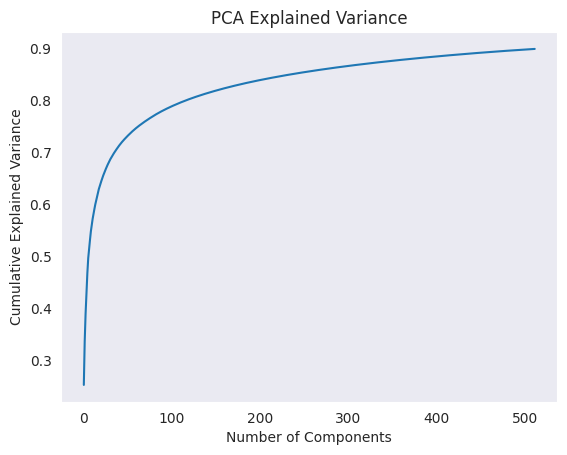

In [9]:
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
pca_dataset = test_ds
pca_dataset_flattened = [(torch.flatten(img).numpy(), label) for img, label in tqdm(pca_dataset, 'flattening')]
del pca_dataset
# # Placeholder for the PCA model you need to create and train
pca = PCA(n_components=512)
pipe = Pipeline([('scaler', StandardScaler()), ('pca', pca)])
pipe.fit([img for img, label in pca_dataset_flattened])
# # Visualize the explained variance ratio of the PCA components
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.grid()
plt.show()

## Modele

In [10]:
import os
models = []
model_names = []
preran = ['pre', 'ran']
lrs = ['-3', '-2']
byol_hip = ['98', '996']
CHECKPOINT5_NAME = 'model_epoch_5.ckpt'
outer_byol_path = os.path.join('checkpoints_imagenet', 'byol')
for arch in preran:
    for lr in lrs:
        for hip in byol_hip:
            dir_name = arch+lr+hip
            checkpoint_path = os.path.join(outer_byol_path, dir_name, CHECKPOINT5_NAME)
            module = BYOLModel.load_from_checkpoint(checkpoint_path)
            model = module.online_backbone
            models.append(model)
            model_name = 'byol'+dir_name
            model_names.append(model_name)
mae_hip = ['75', '90']
outer_mae_path = os.path.join('checkpoints_imagenet', 'mae')
for arch in preran:
    for lr in lrs:
        for hip in mae_hip:
            dir_name = arch+lr+hip
            checkpoint_path = os.path.join(outer_mae_path, dir_name, CHECKPOINT5_NAME)
            module = MAEModel.load_from_checkpoint(checkpoint_path)
            model = module.encoder.backbone
            models.append(model)
            model_name = 'mae'+dir_name
            model_names.append(model_name)
outer_simclr_path = os.path.join('checkpoints_imagenet', 'simclr')
for arch in preran:
    for lr in lrs:
        dir_name = arch+lr
        checkpoint_path = os.path.join(outer_simclr_path, dir_name, CHECKPOINT5_NAME)
        module = SimCLRModel.load_from_checkpoint(checkpoint_path)
        model = module.backbone
        models.append(model)
        model_name = 'simclr'+dir_name
        model_names.append(model_name)

/home/hussein/pytoniec/lib/python3.13/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/hussein/pytoniec/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/hussein/pytoniec/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [11]:
test_dl = torch.utils.data.DataLoader(
    test_ds,
    batch_size=128,
    shuffle=False,
    num_workers=11,
)

In [11]:
def extract_features_sequential_optimized(models, model_names, test_dl, labels_name):
    """
    Memory-optimized sequential feature extraction.
    """
    import os

    features_list = []

    # Create directories|
    os.makedirs('features', exist_ok=True)
    os.makedirs('labels', exist_ok=True)

    # Extract labels once and save immediately
    print("Extracting labels...")
    labels_full = []
    with torch.no_grad():
        for batch_x, labels in tqdm(test_dl, desc="Getting Labels"):
            if torch.is_tensor(labels):
                labels_full.extend(labels.cpu().numpy())
            else:
                labels_full.extend(labels)

    labels_full = np.array(labels_full, dtype=np.int32)
    gc.collect()

    # Process each model separately
    for model_idx, model in enumerate(models):
        print(f"Processing model {model_idx + 1}/{len(models)}: {model_names[model_idx]}")

        model.eval()
        model.to('cuda')

        # Create file path for this model's features
        # feature_file = os.path.join('features', labels_name, f'{model_names[model_idx]}.csv')

        # Process batches and write directly to file

        features = None

        with torch.no_grad():
            for batch_idx, (batch_x, _) in enumerate(tqdm(test_dl, desc=f"Model {model_idx + 1} Features")):
                batch_x = batch_x.to('cuda')

                batch_features = model(batch_x).squeeze().detach().cpu().numpy()

                if features is None:
                    features = batch_features
                else:
                    features = np.vstack((features, batch_features))

                if batch_idx % 5 == 0:  # Clear cache every 5 batches
                    torch.cuda.empty_cache()
                    gc.collect()
        # np.savetxt(feature_file, features, delimiter=',')

        features_list.append(features)

        # Move model to CPU and clear cache
        model.cpu()
        torch.cuda.empty_cache()
        gc.collect()

        print(f"Completed model {model_idx + 1}/{len(models)}")

    return features_list, labels_full


In [13]:
extracted_features, labels_full = extract_features_sequential_optimized(models, model_names, test_dl, 'imagenet')




Extracting labels...


Getting Labels: 100%|██████████| 40/40 [00:03<00:00, 12.16it/s]


Processing model 1/20: byolpre-398


Model 1 Features: 100%|██████████| 40/40 [00:06<00:00,  6.56it/s]


Completed model 1/20
Processing model 2/20: byolpre-3996


Model 2 Features: 100%|██████████| 40/40 [00:05<00:00,  6.88it/s]


Completed model 2/20
Processing model 3/20: byolpre-298


Model 3 Features: 100%|██████████| 40/40 [00:05<00:00,  6.90it/s]


Completed model 3/20
Processing model 4/20: byolpre-2996


Model 4 Features: 100%|██████████| 40/40 [00:05<00:00,  6.91it/s]


Completed model 4/20
Processing model 5/20: byolran-398


Model 5 Features: 100%|██████████| 40/40 [00:05<00:00,  6.93it/s]


Completed model 5/20
Processing model 6/20: byolran-3996


Model 6 Features: 100%|██████████| 40/40 [00:05<00:00,  6.86it/s]


Completed model 6/20
Processing model 7/20: byolran-298


Model 7 Features: 100%|██████████| 40/40 [00:05<00:00,  6.84it/s]


Completed model 7/20
Processing model 8/20: byolran-2996


Model 8 Features: 100%|██████████| 40/40 [00:05<00:00,  6.72it/s]


Completed model 8/20
Processing model 9/20: maepre-375


Model 9 Features: 100%|██████████| 40/40 [00:05<00:00,  6.81it/s]


Completed model 9/20
Processing model 10/20: maepre-390


Model 10 Features: 100%|██████████| 40/40 [00:05<00:00,  6.87it/s]


Completed model 10/20
Processing model 11/20: maepre-275


Model 11 Features: 100%|██████████| 40/40 [00:06<00:00,  6.64it/s]


Completed model 11/20
Processing model 12/20: maepre-290


Model 12 Features: 100%|██████████| 40/40 [00:05<00:00,  6.83it/s]


Completed model 12/20
Processing model 13/20: maeran-375


Model 13 Features: 100%|██████████| 40/40 [00:05<00:00,  6.68it/s]


Completed model 13/20
Processing model 14/20: maeran-390


Model 14 Features: 100%|██████████| 40/40 [00:05<00:00,  6.86it/s]


Completed model 14/20
Processing model 15/20: maeran-275


Model 15 Features: 100%|██████████| 40/40 [00:06<00:00,  6.50it/s]


Completed model 15/20
Processing model 16/20: maeran-290


Model 16 Features: 100%|██████████| 40/40 [00:05<00:00,  6.80it/s]


Completed model 16/20
Processing model 17/20: simclrpre-3


Model 17 Features: 100%|██████████| 40/40 [00:05<00:00,  6.74it/s]


Completed model 17/20
Processing model 18/20: simclrpre-2


Model 18 Features: 100%|██████████| 40/40 [00:06<00:00,  6.63it/s]


Completed model 18/20
Processing model 19/20: simclrran-3


Model 19 Features: 100%|██████████| 40/40 [00:05<00:00,  6.74it/s]


Completed model 19/20
Processing model 20/20: simclrran-2


Model 20 Features: 100%|██████████| 40/40 [00:05<00:00,  6.76it/s]


Completed model 20/20


In [14]:
pca_features = None

with torch.no_grad():
            for batch_idx, (batch_x, _) in enumerate(tqdm(test_dl, desc="PCA Features")):
                batch_x = batch_x.to('cuda')

                batch_x_numpy = batch_x.detach().cpu().numpy()

                batch_x_numpy_reshaped = batch_x_numpy.reshape(batch_x_numpy.shape[0], -1)
                batch_features = pca.transform(batch_x_numpy_reshaped).squeeze()



                if pca_features is None:
                    pca_features = batch_features
                else:
                    pca_features = np.vstack((pca_features, batch_features))

                if batch_idx % 5 == 0:  # Clear cache every 5 batches
                    torch.cuda.empty_cache()
                    gc.collect()


PCA Features: 100%|██████████| 40/40 [00:15<00:00,  2.52it/s]


In [15]:
pca_features = pca_features[:5000]

In [16]:
extracted_features.append(pca_features)
model_names.append('pca')

t-SNE extraction: 100%|██████████| 21/21 [01:53<00:00,  5.39s/it]
/tmp/ipykernel_1117425/2971774166.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', num_classes)
creating plots: 100%|██████████| 21/21 [00:21<00:00,  1.00s/it]


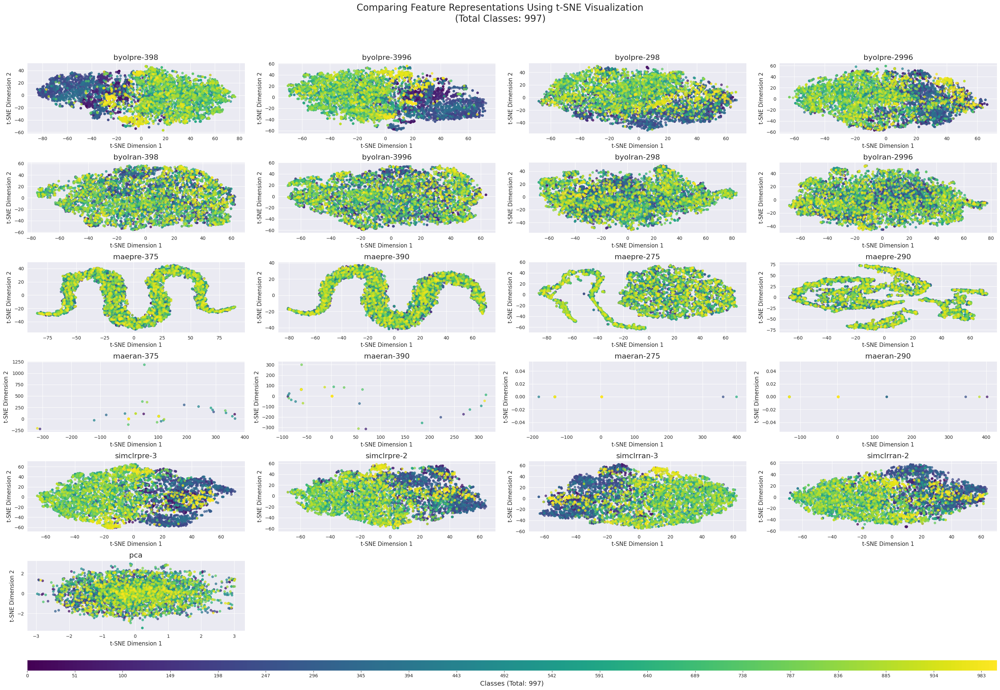

In [17]:
plot_tsne(features_list=extracted_features, feature_names_list=model_names, labels=labels_full)

umap extraction:   0%|          | 0/21 [00:00<?, ?it/s]/home/hussein/pytoniec/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/hussein/pytoniec/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
umap extraction:   5%|▍         | 1/21 [00:17<05:45, 17.27s/it]/home/hussein/pytoniec/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
umap extraction:  10%|▉         | 2/21 [00:20<02:52,  9.07s/it]/home/hussein/pytoniec/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
umap extraction:  14

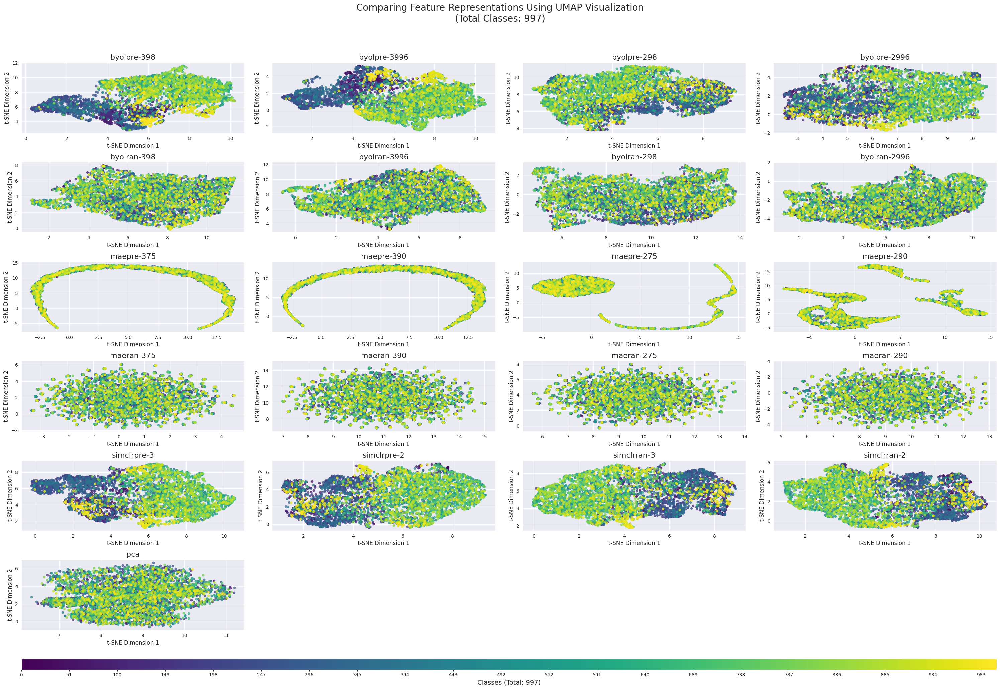

In [18]:
plot_umap(features_list=extracted_features, feature_names_list=model_names, labels=labels_full)

In [22]:
del pca
del test_ds
del labels
del indices
del pipe
del test_dl
del extracted_features
del labels_full
del pca_features

# CIFAR100

In [6]:
test_ds, labels = create_test_with_labels("CIFAR100", test_transform, 'data', False)

Length of test dataset:  10000


In [7]:
indices =  random.sample(range(len(test_ds)), 5000)
test_ds = torch.utils.data.Subset(test_ds, indices)
labels = labels[indices]

flattening: 100%|██████████| 5000/5000 [00:02<00:00, 1934.04it/s]


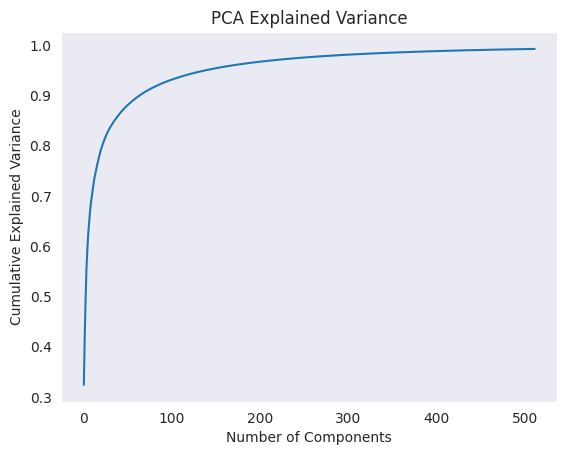

In [8]:
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
pca_dataset = test_ds
pca_dataset_flattened = [(torch.flatten(img).numpy(), label) for img, label in tqdm(pca_dataset, 'flattening')]
del pca_dataset
# # Placeholder for the PCA model you need to create and train
pca = PCA(n_components=512)
pipe = Pipeline([('scaler', StandardScaler()), ('pca', pca)])
pipe.fit([img for img, label in pca_dataset_flattened])
# # Visualize the explained variance ratio of the PCA components
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.grid()
plt.show()

In [9]:
test_dl = torch.utils.data.DataLoader(
    test_ds,
    batch_size=128,
    shuffle=False,
    num_workers=11,
)

In [18]:
import os
models = []
model_names = []
preran = ['pre', 'ran']
lrs = ['-3', '-2']
byol_hip = ['98', '996']
CHECKPOINT5_NAME = 'model_epoch_15.ckpt'
outer_byol_path = os.path.join('checkpoints_100', 'byol')
for arch in preran:
    for lr in lrs:
        for hip in byol_hip:
            dir_name = arch+lr+hip
            checkpoint_path = os.path.join(outer_byol_path, dir_name, CHECKPOINT5_NAME)
            module = BYOLModel.load_from_checkpoint(checkpoint_path)
            model = module.online_backbone
            models.append(model)
            model_name = 'byol'+dir_name
            model_names.append(model_name)
mae_hip = ['75', '90']
outer_mae_path = os.path.join('checkpoints_100', 'mae')
for arch in preran:
    for lr in lrs:
        for hip in mae_hip:
            dir_name = arch+lr+hip
            checkpoint_path = os.path.join(outer_mae_path, dir_name, CHECKPOINT5_NAME)
            module = MAEModel.load_from_checkpoint(checkpoint_path)
            model = module.encoder.backbone
            models.append(model)
            model_name = 'mae'+dir_name
            model_names.append(model_name)
outer_simclr_path = os.path.join('checkpoints_100', 'simclr')
for arch in preran:
    for lr in lrs:
        dir_name = arch+lr
        checkpoint_path = os.path.join(outer_simclr_path, dir_name, CHECKPOINT5_NAME)
        module = SimCLRModel.load_from_checkpoint(checkpoint_path)
        model = module.backbone
        models.append(model)
        model_name = 'simclr'+dir_name
        model_names.append(model_name)

/home/hussein/pytoniec/lib/python3.13/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/hussein/pytoniec/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/hussein/pytoniec/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [19]:
extracted_features, labels_full = extract_features_sequential_optimized(models, model_names, test_dl, 'cifar100')

Extracting labels...


Getting Labels: 100%|██████████| 40/40 [00:01<00:00, 21.71it/s]


Processing model 1/20: byolpre-398


Model 1 Features: 100%|██████████| 40/40 [00:05<00:00,  7.33it/s]


Completed model 1/20
Processing model 2/20: byolpre-3996


Model 2 Features: 100%|██████████| 40/40 [00:05<00:00,  7.41it/s]


Completed model 2/20
Processing model 3/20: byolpre-298


Model 3 Features: 100%|██████████| 40/40 [00:05<00:00,  6.69it/s]


Completed model 3/20
Processing model 4/20: byolpre-2996


Model 4 Features: 100%|██████████| 40/40 [00:05<00:00,  6.92it/s]


Completed model 4/20
Processing model 5/20: byolran-398


Model 5 Features: 100%|██████████| 40/40 [00:05<00:00,  6.98it/s]


Completed model 5/20
Processing model 6/20: byolran-3996


Model 6 Features: 100%|██████████| 40/40 [00:05<00:00,  7.33it/s]


Completed model 6/20
Processing model 7/20: byolran-298


Model 7 Features: 100%|██████████| 40/40 [00:05<00:00,  7.12it/s]


Completed model 7/20
Processing model 8/20: byolran-2996


Model 8 Features: 100%|██████████| 40/40 [00:05<00:00,  6.82it/s]


Completed model 8/20
Processing model 9/20: maepre-375


Model 9 Features: 100%|██████████| 40/40 [00:05<00:00,  6.70it/s]


Completed model 9/20
Processing model 10/20: maepre-390


Model 10 Features: 100%|██████████| 40/40 [00:06<00:00,  6.60it/s]


Completed model 10/20
Processing model 11/20: maepre-275


Model 11 Features: 100%|██████████| 40/40 [00:05<00:00,  7.40it/s]


Completed model 11/20
Processing model 12/20: maepre-290


Model 12 Features: 100%|██████████| 40/40 [00:05<00:00,  7.24it/s]


Completed model 12/20
Processing model 13/20: maeran-375


Model 13 Features: 100%|██████████| 40/40 [00:05<00:00,  6.86it/s]


Completed model 13/20
Processing model 14/20: maeran-390


Model 14 Features: 100%|██████████| 40/40 [00:05<00:00,  7.41it/s]


Completed model 14/20
Processing model 15/20: maeran-275


Model 15 Features: 100%|██████████| 40/40 [00:05<00:00,  7.01it/s]


Completed model 15/20
Processing model 16/20: maeran-290


Model 16 Features: 100%|██████████| 40/40 [00:05<00:00,  6.90it/s]


Completed model 16/20
Processing model 17/20: simclrpre-3


Model 17 Features: 100%|██████████| 40/40 [00:05<00:00,  6.93it/s]


Completed model 17/20
Processing model 18/20: simclrpre-2


Model 18 Features: 100%|██████████| 40/40 [00:05<00:00,  7.04it/s]


Completed model 18/20
Processing model 19/20: simclrran-3


Model 19 Features: 100%|██████████| 40/40 [00:05<00:00,  7.35it/s]


Completed model 19/20
Processing model 20/20: simclrran-2


Model 20 Features: 100%|██████████| 40/40 [00:05<00:00,  7.36it/s]


Completed model 20/20


In [21]:
pca_features = None

with torch.no_grad():
            for batch_idx, (batch_x, _) in enumerate(tqdm(test_dl, desc="PCA Features")):
                batch_x = batch_x.to('cuda')

                batch_x_numpy = batch_x.detach().cpu().numpy()

                batch_x_numpy_reshaped = batch_x_numpy.reshape(batch_x_numpy.shape[0], -1)
                batch_features = pca.transform(batch_x_numpy_reshaped).squeeze()



                if pca_features is None:
                    pca_features = batch_features
                else:
                    pca_features = np.vstack((pca_features, batch_features))

                if batch_idx % 5 == 0:  # Clear cache every 5 batches
                    torch.cuda.empty_cache()
                    gc.collect()

PCA Features: 100%|██████████| 40/40 [00:11<00:00,  3.59it/s]


In [22]:
len(pca_features)

5000

In [23]:
pca_features = pca_features[:5000]
extracted_features.append(pca_features)
model_names.append('pca')

umap extraction: 100%|██████████| 21/21 [01:53<00:00,  5.39s/it]
/tmp/ipykernel_1379424/544844757.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', num_classes)
creating plots: 100%|██████████| 21/21 [00:01<00:00, 12.28it/s]


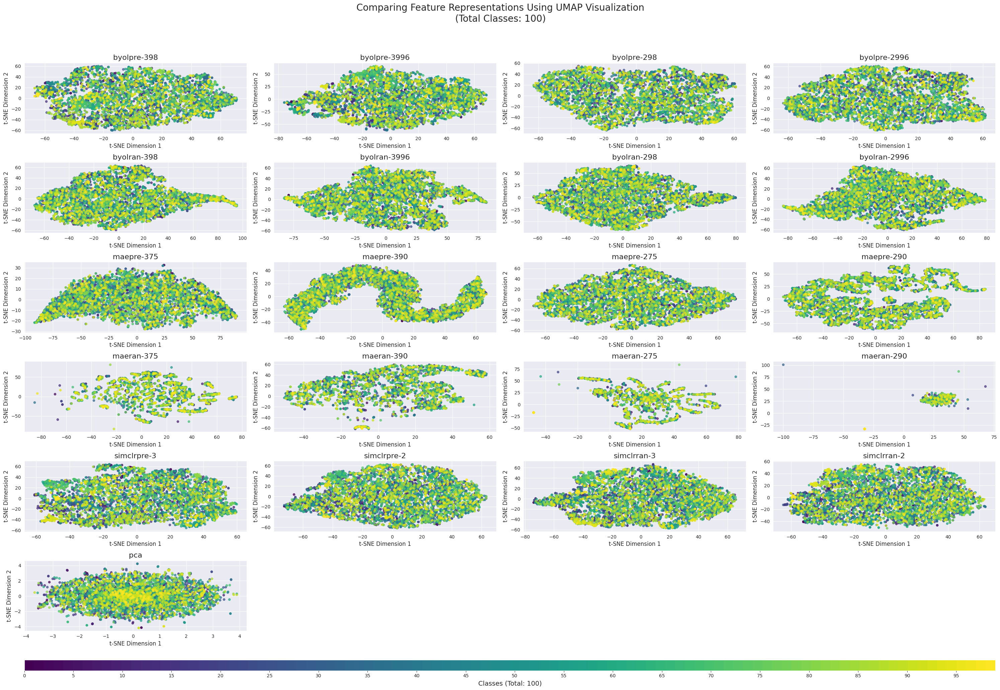

In [24]:
plot_tsne(features_list=extracted_features, feature_names_list=model_names, labels=labels_full, random_seed=2137)

umap extraction:   0%|          | 0/21 [00:00<?, ?it/s]/home/hussein/pytoniec/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/hussein/pytoniec/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
umap extraction:   5%|▍         | 1/21 [00:14<04:52, 14.65s/it]/home/hussein/pytoniec/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
umap extraction:  10%|▉         | 2/21 [00:17<02:29,  7.88s/it]/home/hussein/pytoniec/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
umap extraction:  14

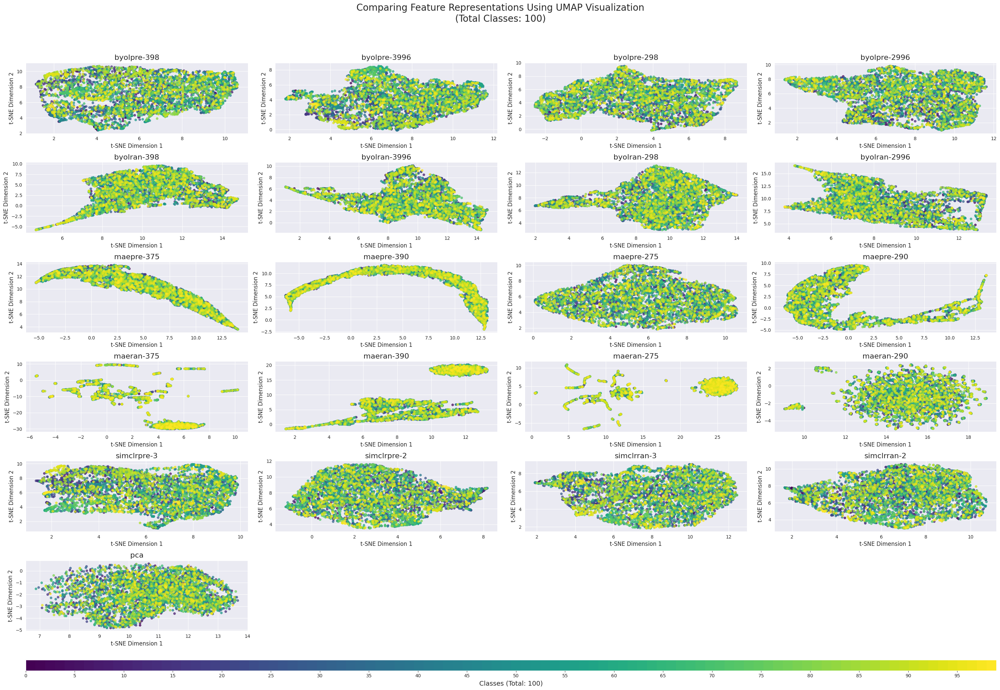

In [27]:
plot_umap(features_list=extracted_features, feature_names_list=model_names, labels=labels_full, random_seed=2137)